In [9]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook

In [10]:
import numpy as np
from numpy.linalg import norm, inv, det
import matplotlib.pyplot as plt
import itertools as it
import pandas as pd
from scipy.spatial import ConvexHull
from mpl_toolkits.mplot3d import Axes3D

from BZI.make_IBZ import (find_bz, get_bragg_planes, get_bragg_shells, trim_small,
                          three_planes_intersect, point_plane_location)
from BZI.plots import plot_bz
from BZI.symmetry import *

In [12]:
def plot_bz_ibz(lat_type, lat_vecs, sympts):
    rlat_vecs = make_rptvecs(lat_vecs)
    bz = find_bz(rlat_vecs)
    print("BZ expected volume: ", det(rlat_vecs))
    print("BZ volume: ", bz.volume)

    # Get the vertices of the IBZ.
    ibz_vertices = list(sympts.values())
    ibz_vertices = [np.dot(rlat_vecs, v) for v in ibz_vertices]

    # Get the symmetry points in Cartesian coordinates.
    sympts_cart = {}
    for spt in sympts.keys():
        sympts_cart[spt] = np.dot(rlat_vecs, sympts[spt])

    ibz = ConvexHull(ibz_vertices)
    nops = number_of_point_operators(lat_type.split()[-1])
    print("IBZ expected volume: ", det(rlat_vecs)/nops)
    print("IBZ volume: ", ibz.volume)

    plot_bz(bz)
    plot_bz(ibz, sympts_cart)

# Cubic Brillouin zones

## Simple cubic (CUB, cP)

BZ expected volume:  0.125
BZ volume:  0.125
IBZ expected volume:  0.00260416666667
IBZ volume:  0.002604166666666666


<IPython.core.display.Javascript object>


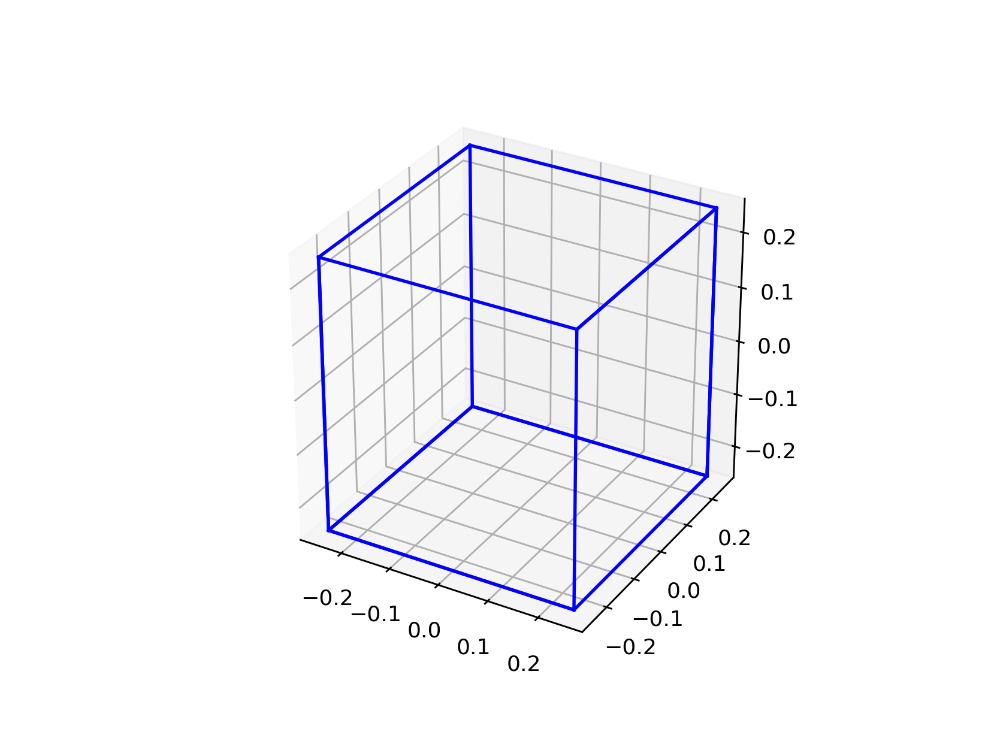

<IPython.core.display.Javascript object>


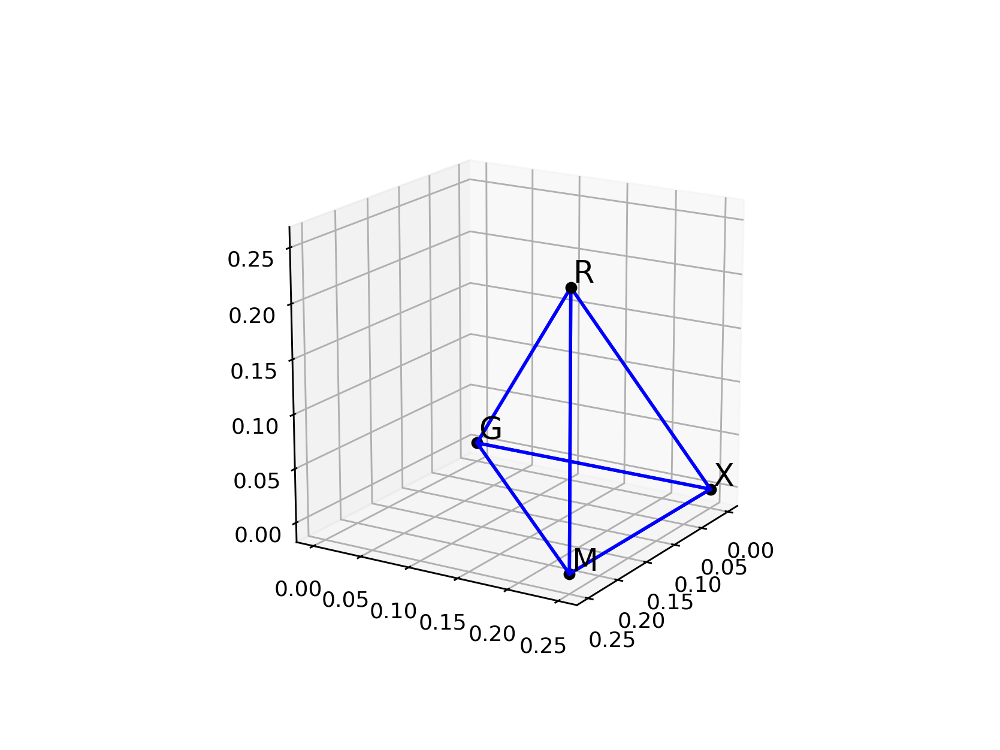

In [158]:
lat_type = "simple cubic"
lat_vecs = make_lattice_vectors(lat_type, [2]*3, [np.pi/2]*3)
plot_bz_ibz(lat_type, lat_vecs, sc_sympts)

## Body-centered cubic (BCC, cI)

BZ expected volume:  0.25
BZ volume:  0.25000000000000017
IBZ expected volume:  0.00520833333333
IBZ volume:  0.005208333333333332


<IPython.core.display.Javascript object>


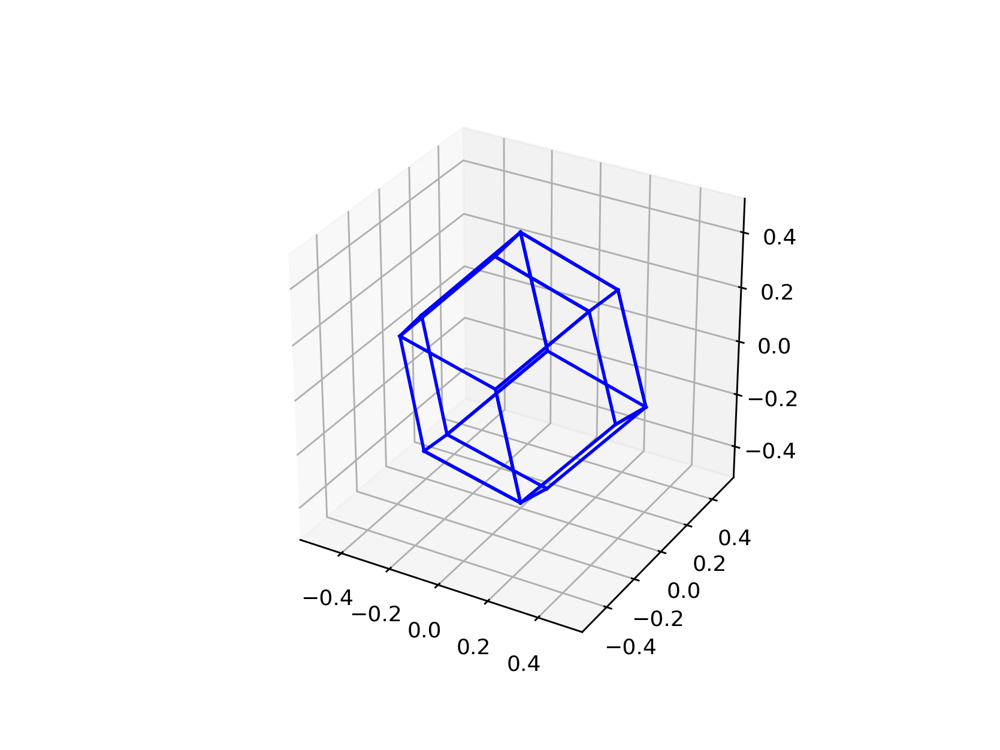

<IPython.core.display.Javascript object>


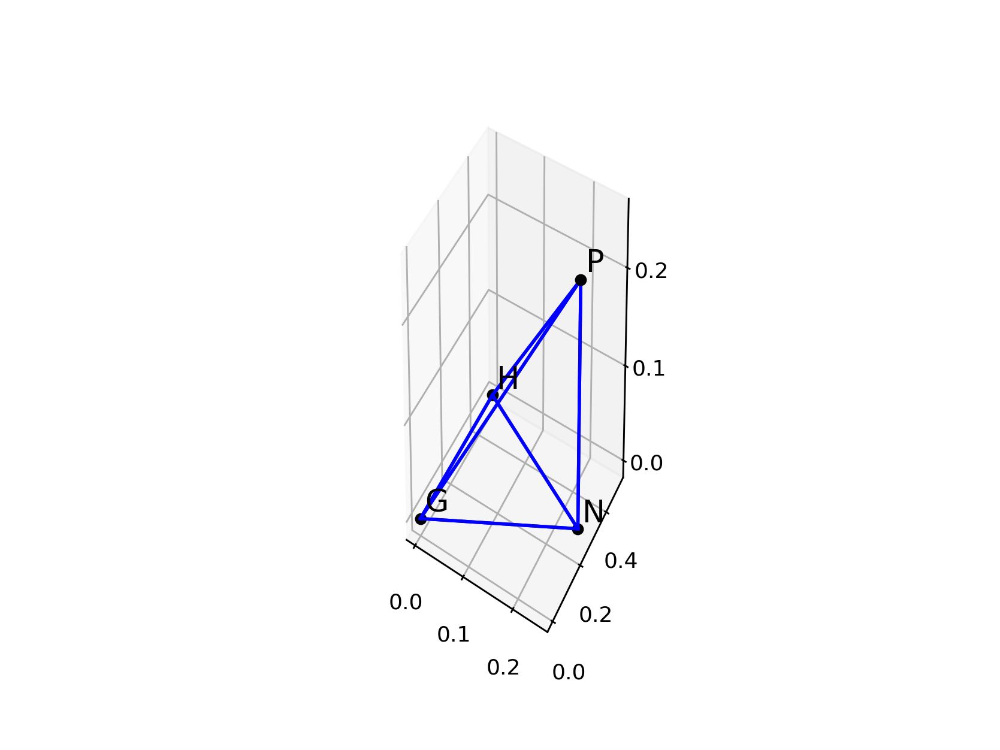

In [160]:
lat_type = "body-centered cubic"
lat_vecs = make_lattice_vectors(lat_type, [2]*3, [np.pi/2]*3)
plot_bz_ibz(lat_type, lat_vecs, bcc_sympts)

## Face-centered cubic (FCC, cF)

BZ expected volume:  0.5
BZ volume:  0.49999999999999967
IBZ expected volume:  0.0104166666667
IBZ volume:  0.010416666666666668


<IPython.core.display.Javascript object>


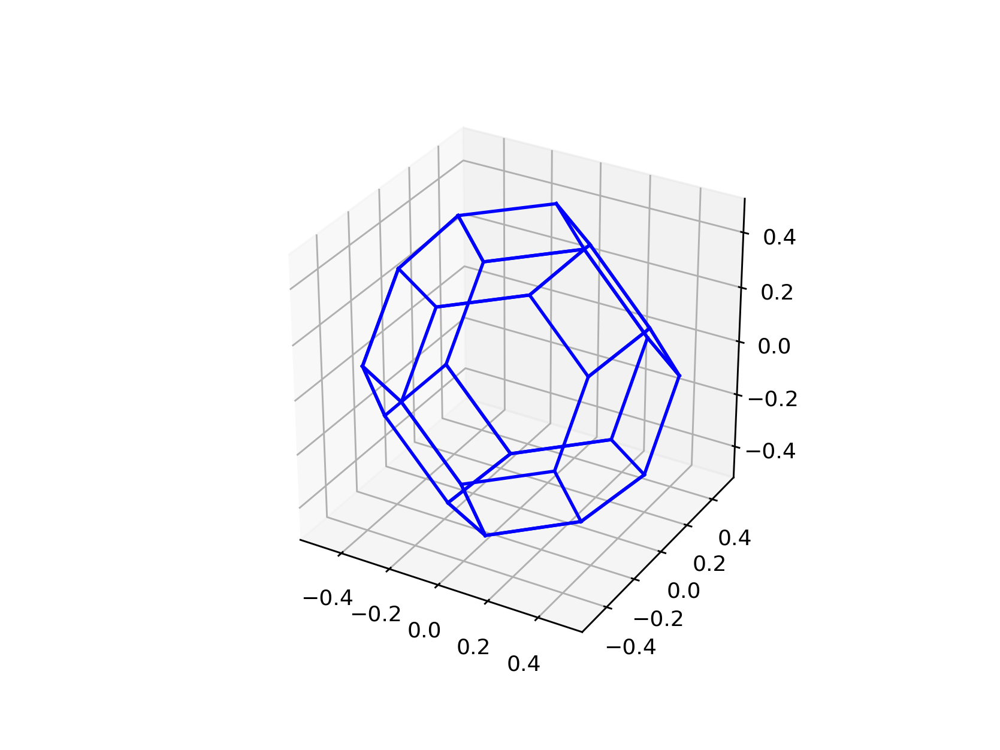

<IPython.core.display.Javascript object>


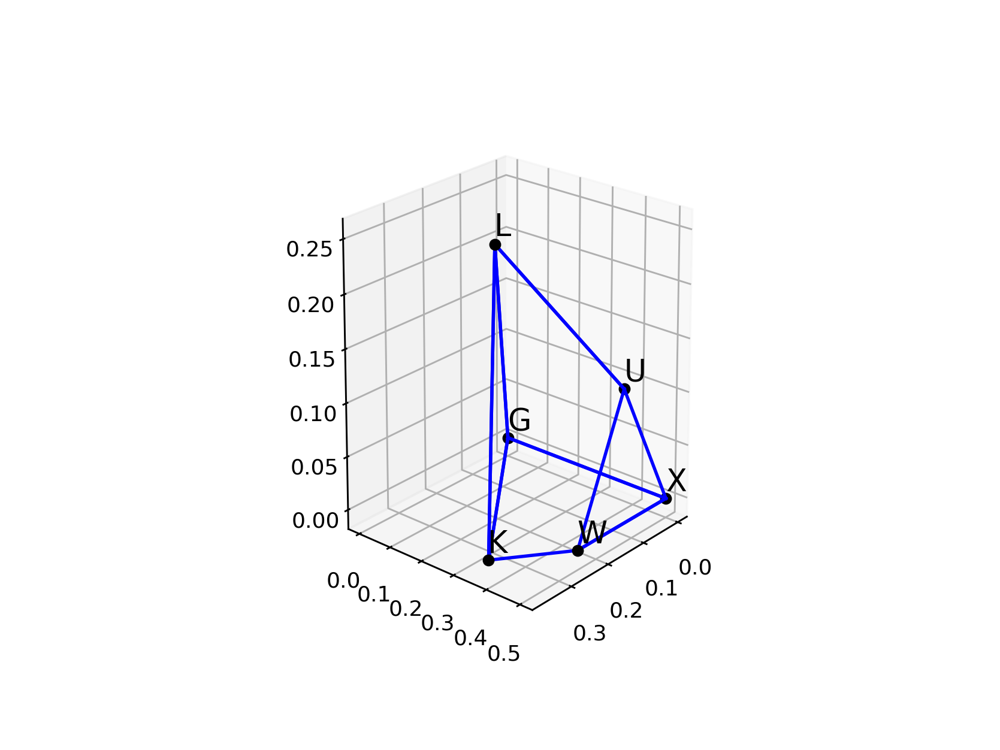

In [161]:
lat_type = "face-centered cubic"
lat_vecs = make_lattice_vectors(lat_type, [2]*3, [np.pi/2]*3)
plot_bz_ibz(lat_type, lat_vecs, fcc_sympts)

# Tetragonal Brillouin zones

## Tetragonal (TET tP)

BZ expected volume:  0.5
BZ volume:  0.5
IBZ expected volume:  0.03125
IBZ volume:  0.03125


<IPython.core.display.Javascript object>


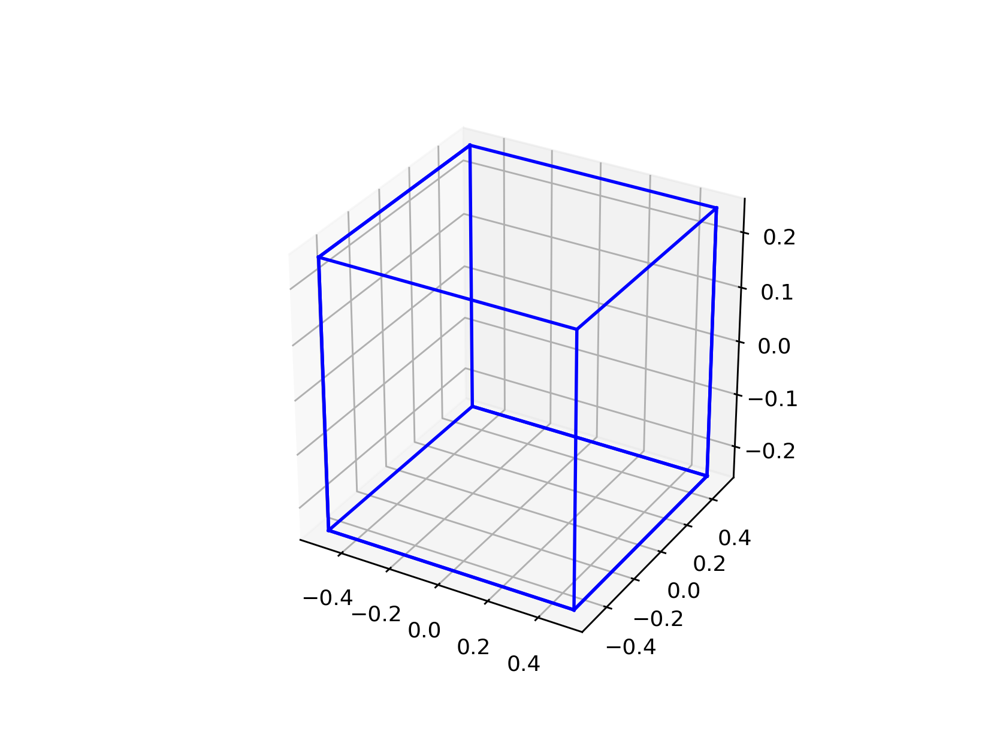

<IPython.core.display.Javascript object>


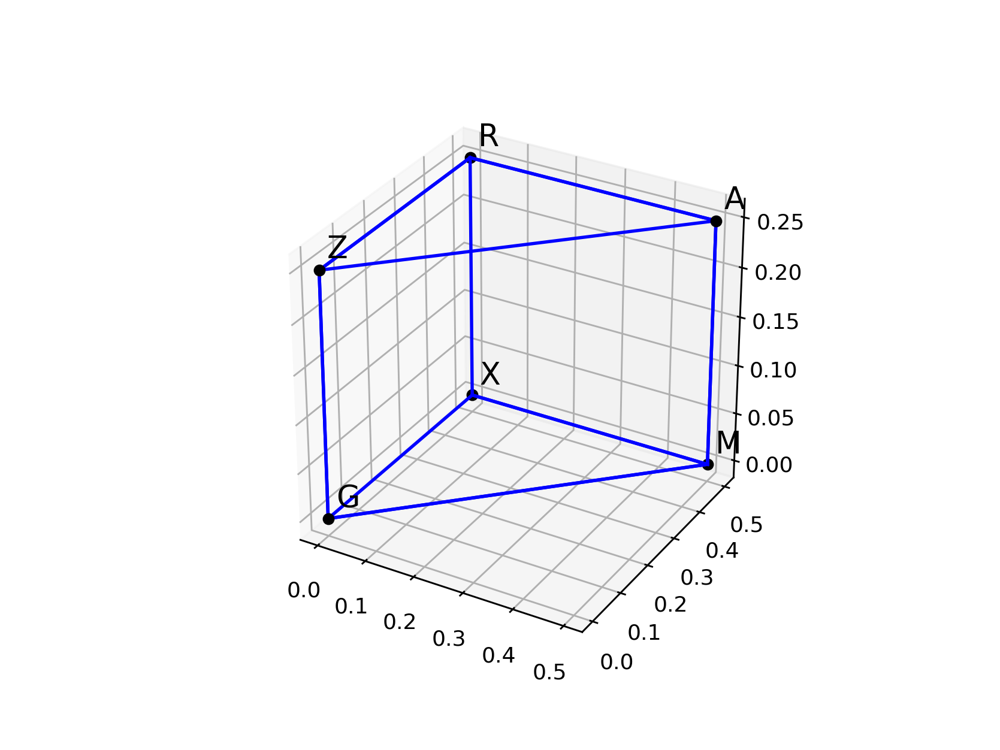

In [162]:
lat_type = "tetragonal"
lat_vecs = make_lattice_vectors("tetragonal", [1,1,2], [np.pi/2]*3)
plot_bz_ibz(lat_type, lat_vecs, tet_sympts)

## Body-centered tetragonal (BCT, tI)

### $BCT_1$

BZ expected volume:  0.0185185185185
BZ volume:  0.01851851851851852
IBZ expected volume:  0.00115740740741
IBZ volume:  0.0011574074074074071


<IPython.core.display.Javascript object>


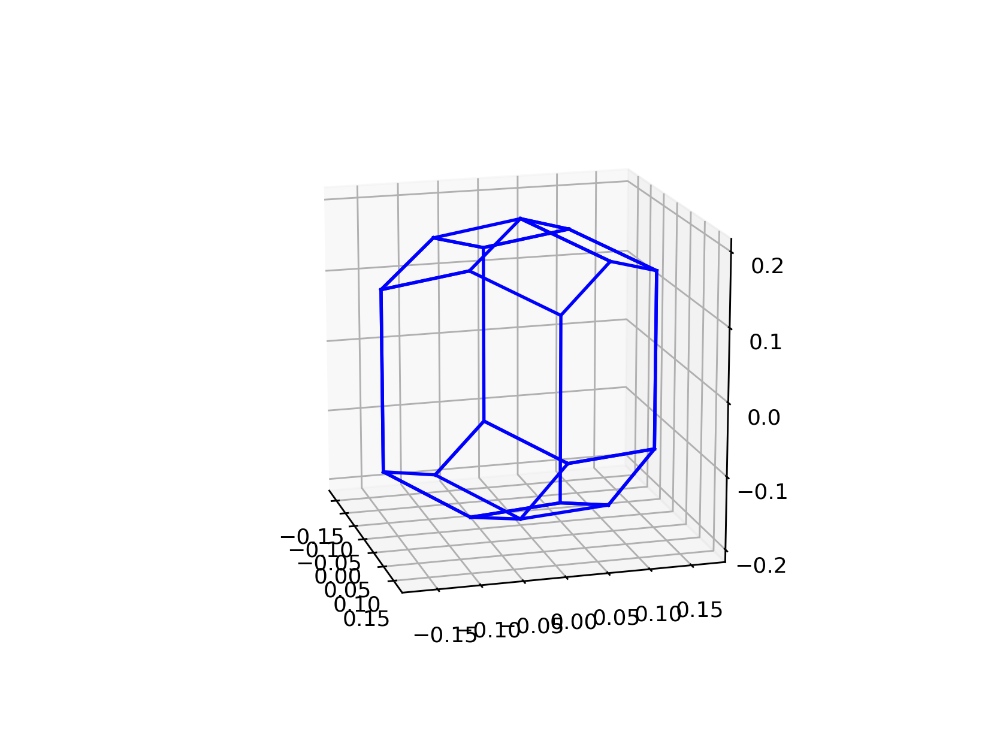

<IPython.core.display.Javascript object>


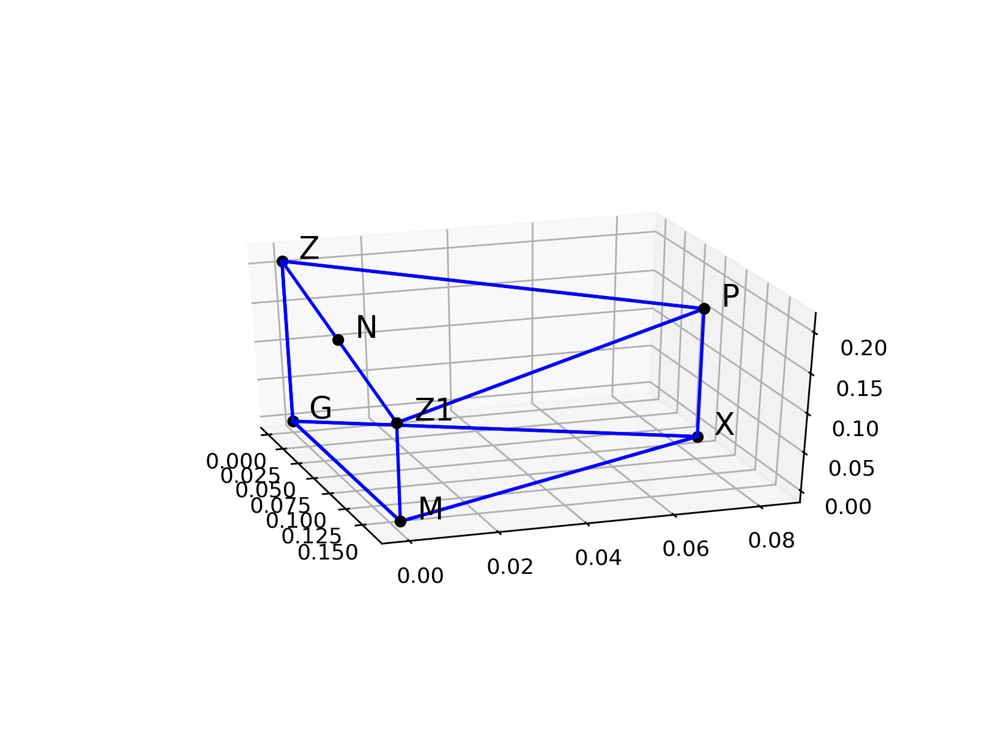

In [163]:
lat_type = "body-centered tetragonal"
lat_vecs = make_lattice_vectors(lat_type, [6,6,3],[np.pi/2]*3)
bct1_sym_points = bct1_sympts(6,3)
plot_bz_ibz(lat_type, lat_vecs, bct1_sym_points)

### $BCT_2$

BZ expected volume:  0.037037037037
BZ volume:  0.03703703703703702
IBZ expected volume:  0.00231481481481
IBZ volume:  0.0023148148148148143


<IPython.core.display.Javascript object>


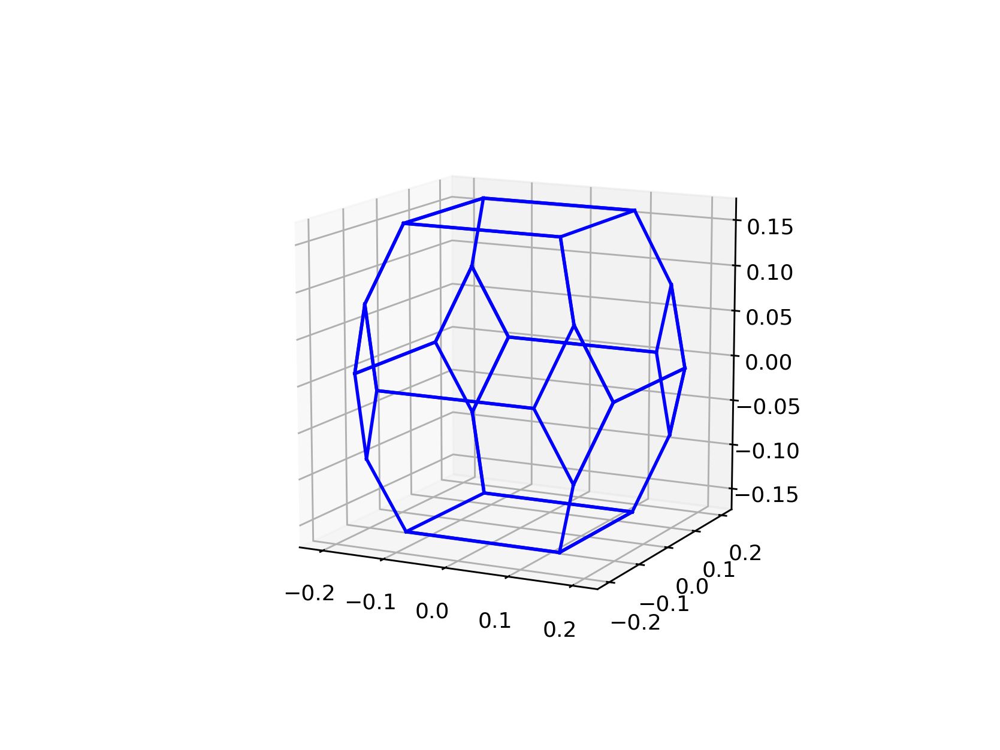

<IPython.core.display.Javascript object>


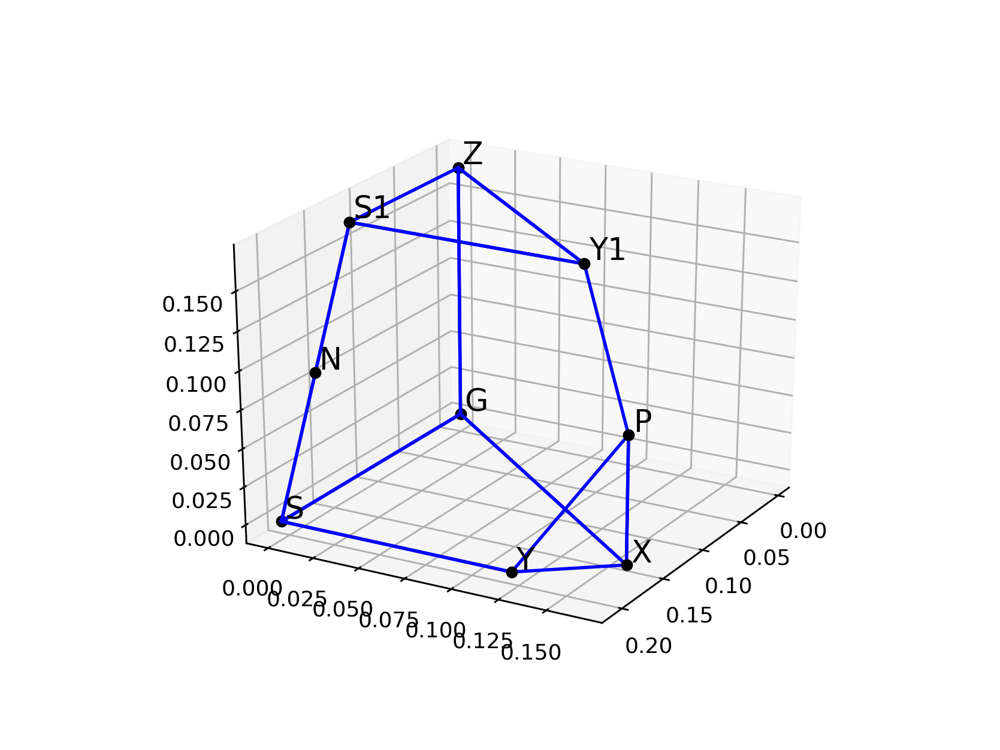

In [166]:
lat_type = "body-centered tetragonal"
lat_vecs = make_lattice_vectors(lat_type, [3,3,6],[np.pi/2]*3)
bct1_sym_points = bct2_sympts(3,6)
plot_bz_ibz(lat_type, lat_vecs, bct1_sym_points)

# Orthorhombic Brillouin zones

## Orthorhombic (ORC, oP)

BZ expected volume:  0.000970685303825
BZ volume:  0.0009706853038245003
IBZ expected volume:  0.000121335662978
IBZ volume:  0.00012133566297806253


<IPython.core.display.Javascript object>


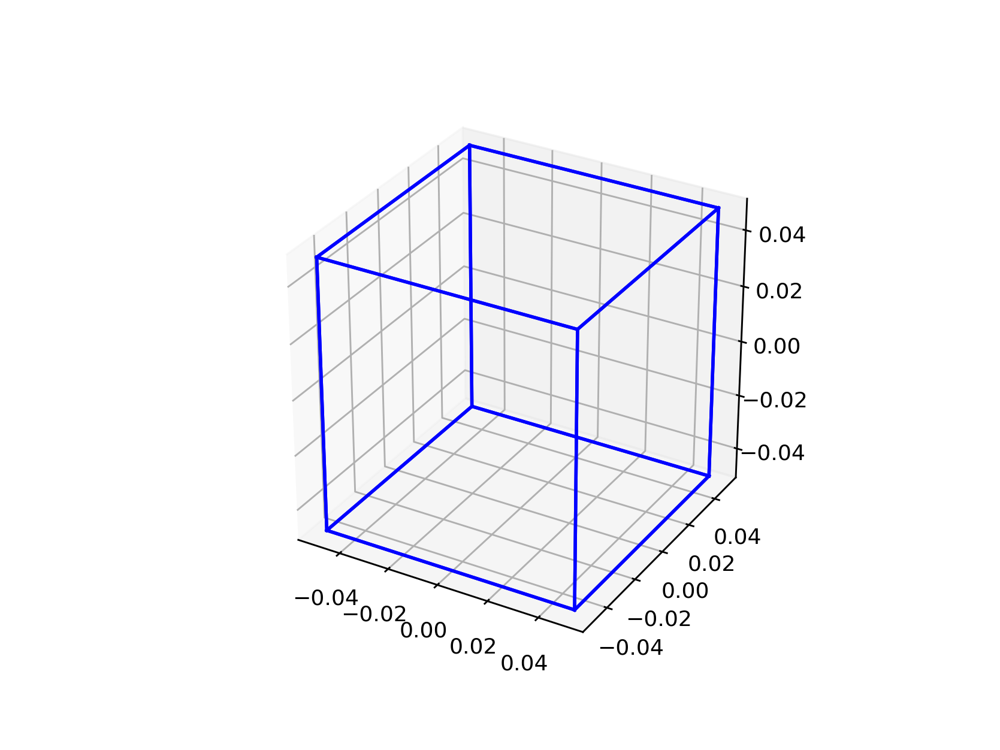

<IPython.core.display.Javascript object>


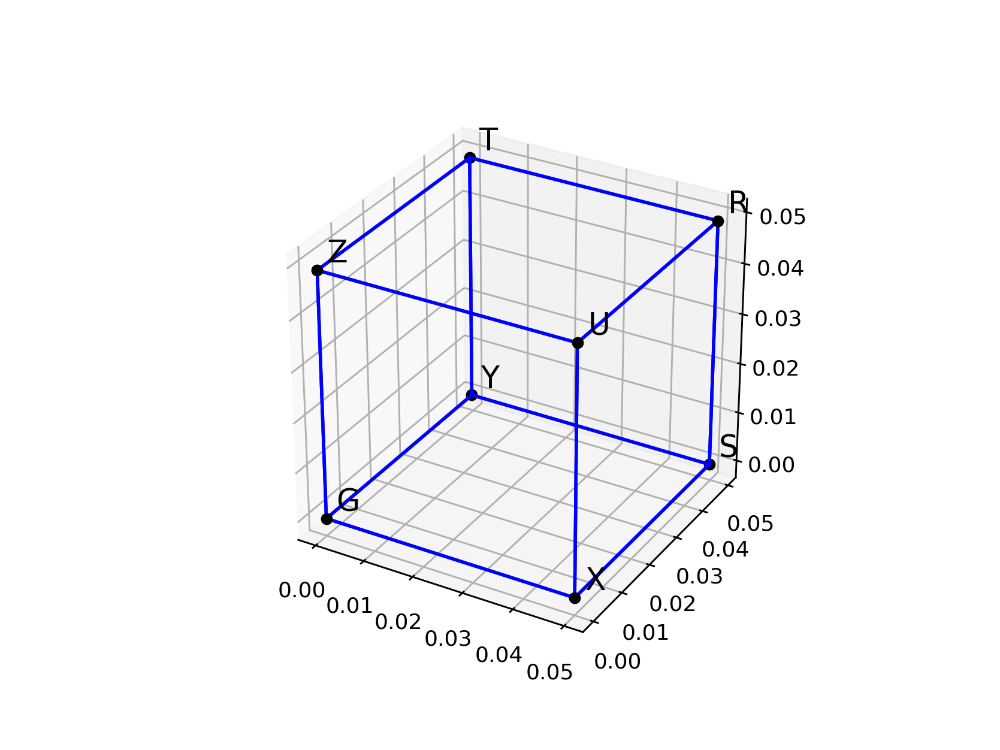

In [173]:
lat_type = "orthorhombic"
lat_vecs = make_lattice_vectors("orthorhombic", [10, 10.1, 10.2], [np.pi/2]*3)
plot_bz_ibz(lat_type, lat_vecs, orc_sympts)

## Face-centered orthorhombic (ORCF, oF)

### $ORCF_1$

BZ expected volume:  0.00909090909091
BZ volume:  0.00909090909090909
IBZ expected volume:  0.00113636363636
IBZ volume:  0.0011363636363636365


<IPython.core.display.Javascript object>


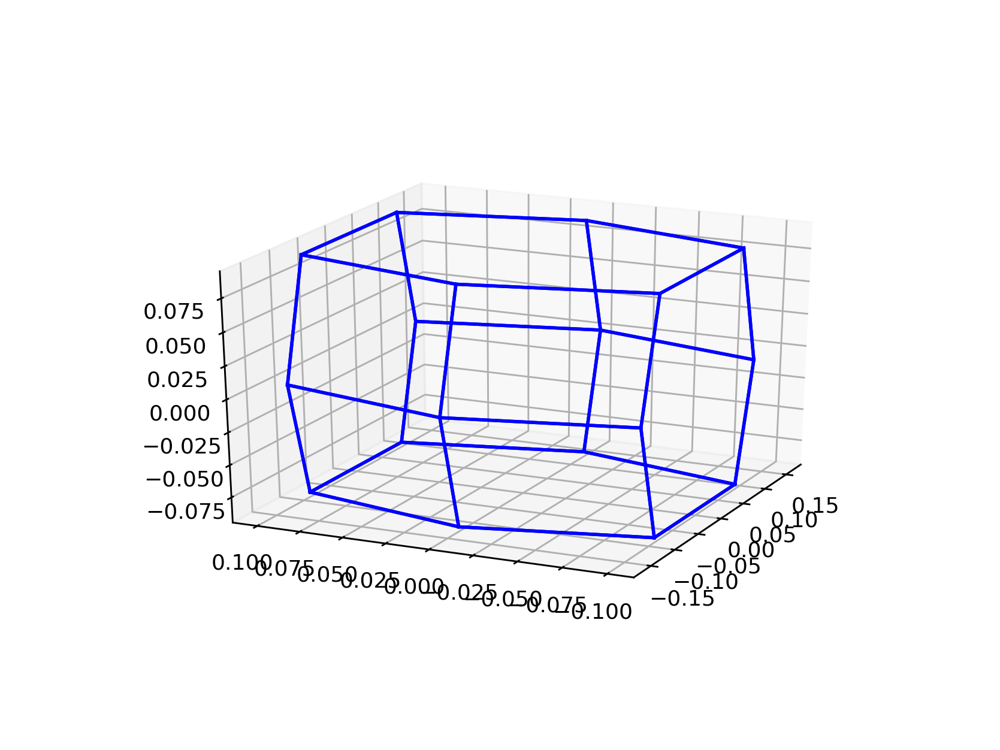

<IPython.core.display.Javascript object>


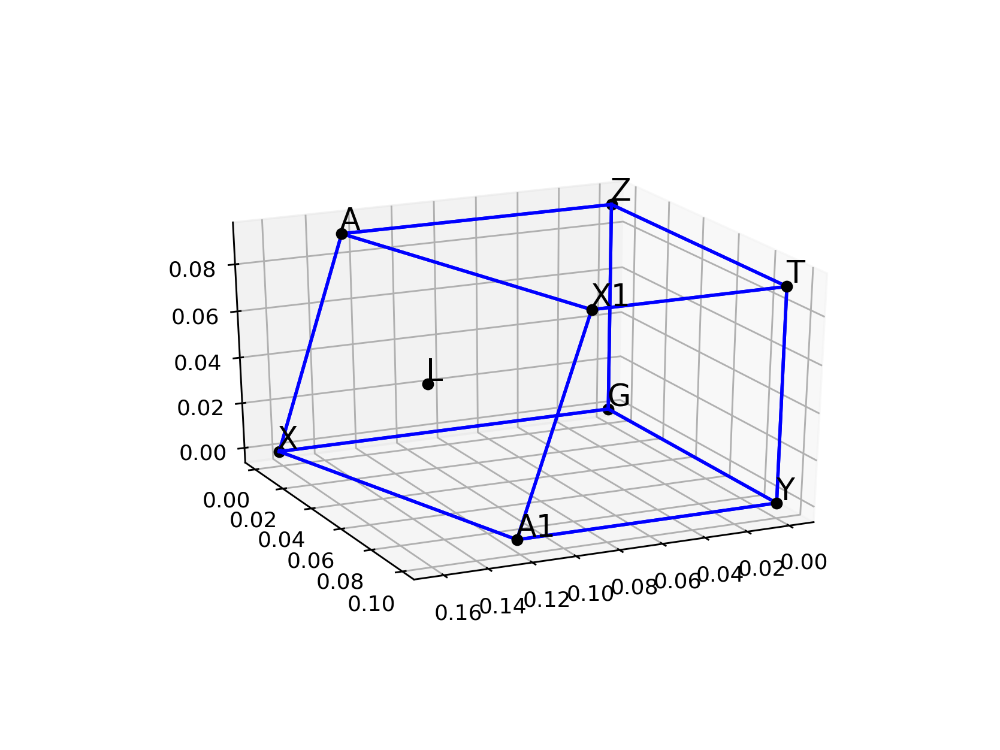

In [203]:
lat_type = "face-centered orthorhombic"
lat_vecs = make_lattice_vectors(lat_type, [4, 10, 11],
                                [np.pi/2]*3)
sympts = orcf13_sympts(4, 10, 11)
plot_bz_ibz(lat_type, lat_vecs, sympts)

### $ORCF_2$

BZ expected volume:  0.0030303030303
BZ volume:  0.0030303030303030316
IBZ expected volume:  0.000378787878788
IBZ volume:  0.0003787878787878788


<IPython.core.display.Javascript object>


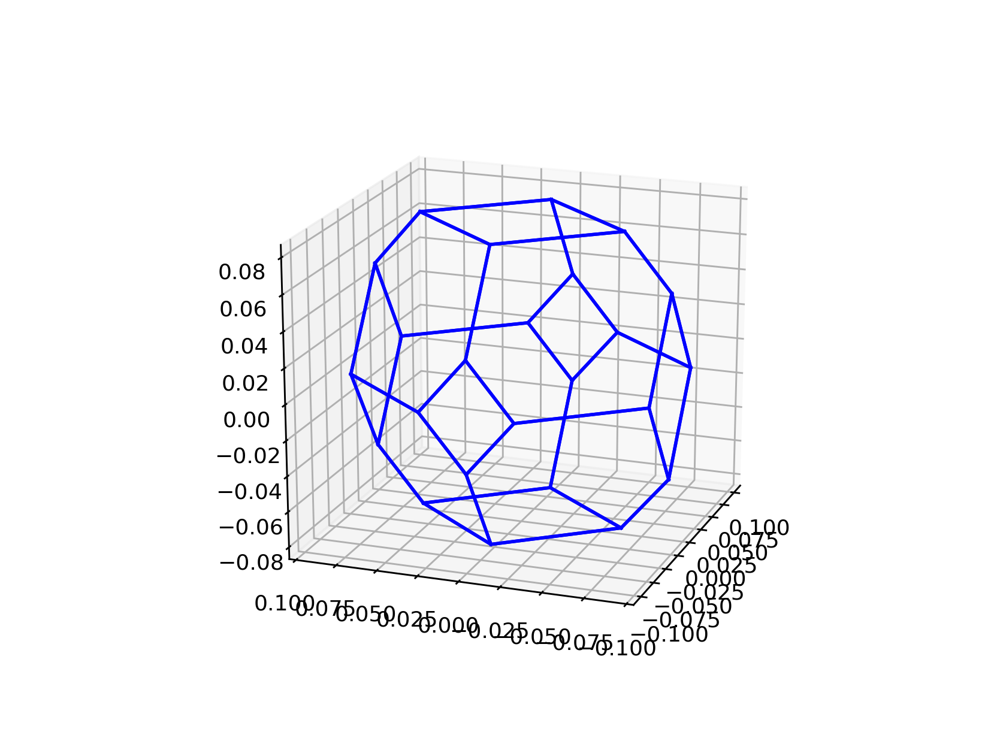

<IPython.core.display.Javascript object>


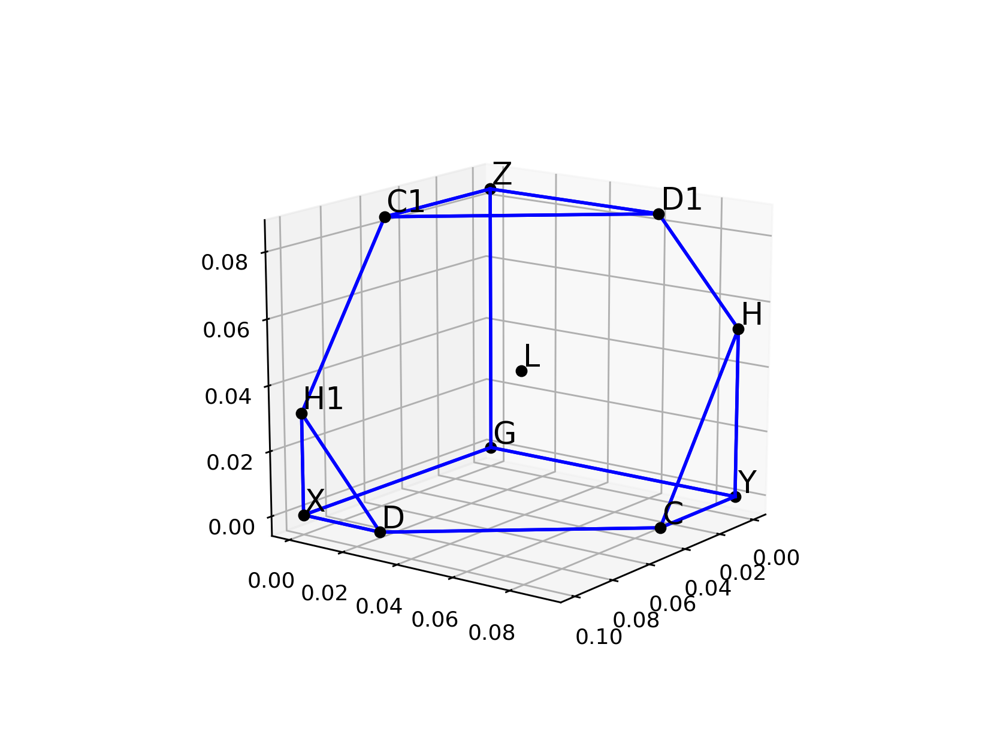

In [219]:
lat_type = "face-centered orthorhombic"
lat_vecs = make_lattice_vectors(lat_type, [10, 11, 12],
                                [np.pi/2]*3)
sympts = orcf2_sympts(10, 11, 12)
plot_bz_ibz(lat_type, lat_vecs, sympts)

### $ORCF_3$

BZ expected volume:  0.00373710298349
BZ volume:  0.0037371029834939633
IBZ expected volume:  0.000467137872937
IBZ volume:  0.00046713787293674547


<IPython.core.display.Javascript object>


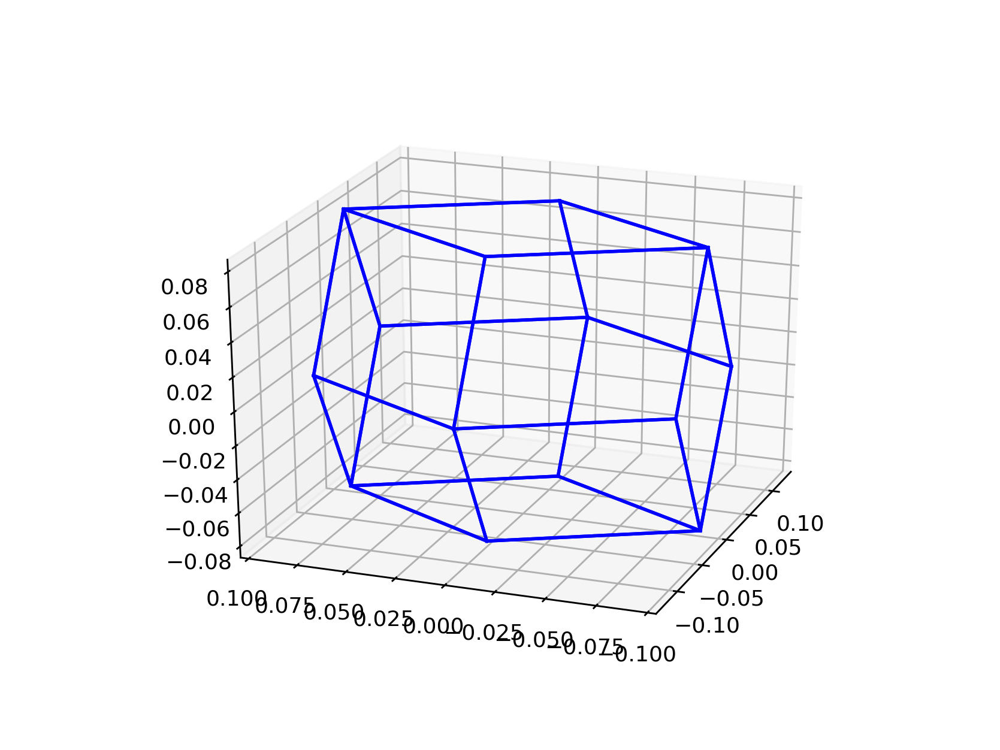

<IPython.core.display.Javascript object>


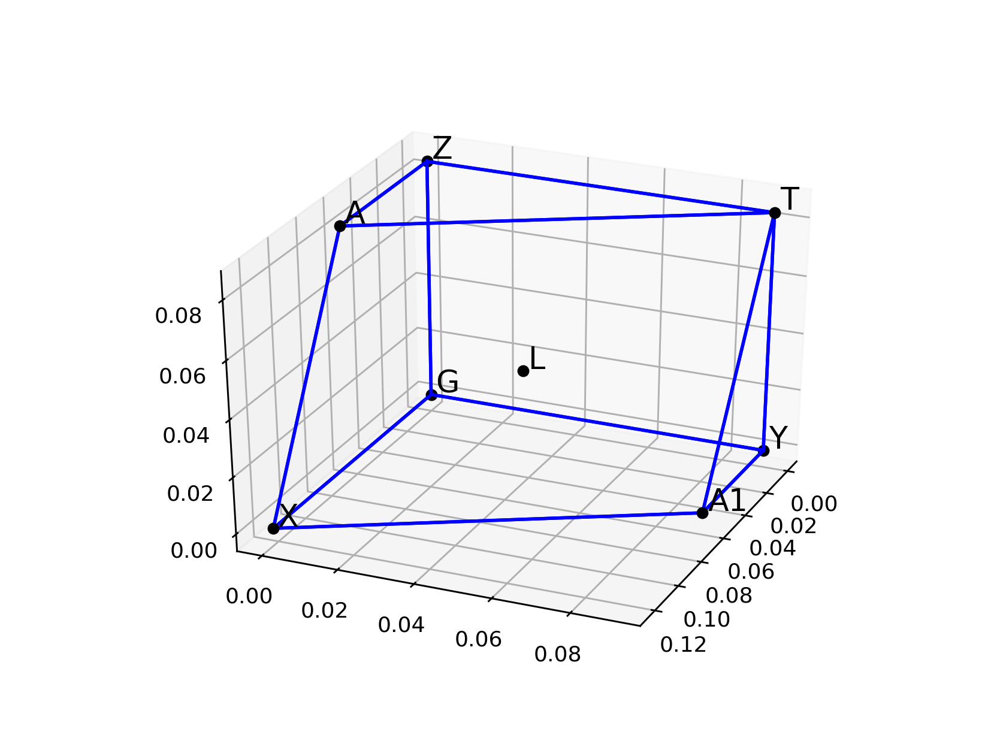

In [223]:
a = 8.108695542208157
lat_type = "face-centered orthorhombic"
lat_vecs = make_lattice_vectors(lat_type, [a, 11, 12],
                                [np.pi/2]*3)
sympts = orcf13_sympts(a, 11, 12)
# Remove X1 since it overlaps with T and doesn't appear in the Setyawan paper.
del sympts["X1"]
plot_bz_ibz(lat_type, lat_vecs, sympts)

## Body-centered orthorhombic (ORCI, oI)

BZ expected volume:  0.00119047619048
BZ volume:  0.0011904761904761908
IBZ expected volume:  0.00014880952381
IBZ volume:  0.00014880952380952377


<IPython.core.display.Javascript object>


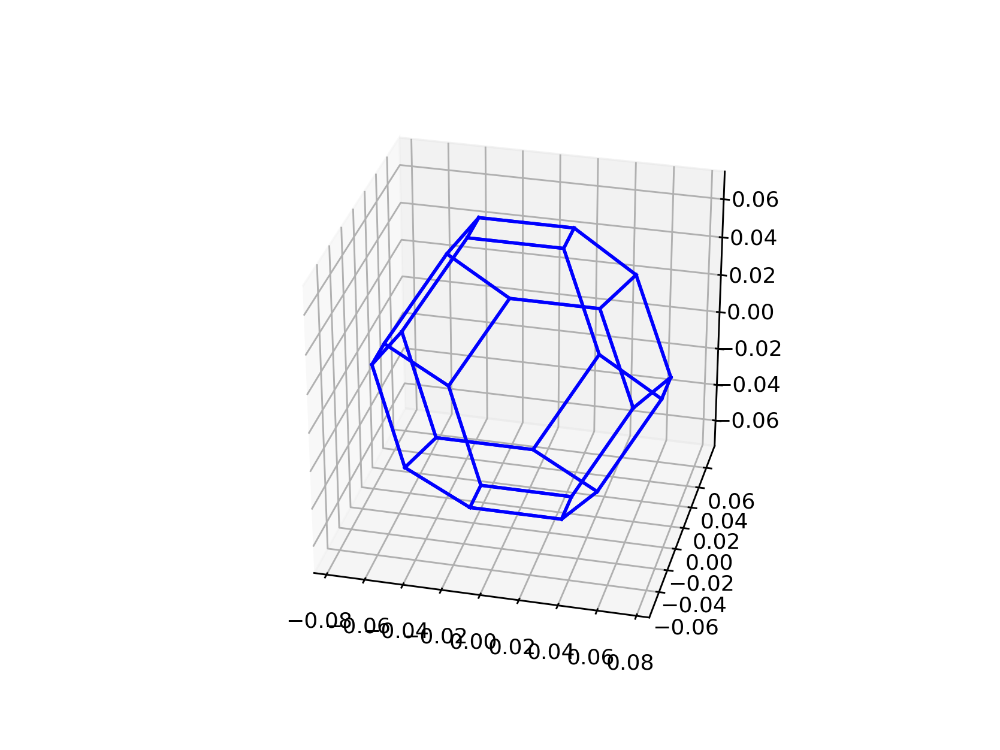

<IPython.core.display.Javascript object>


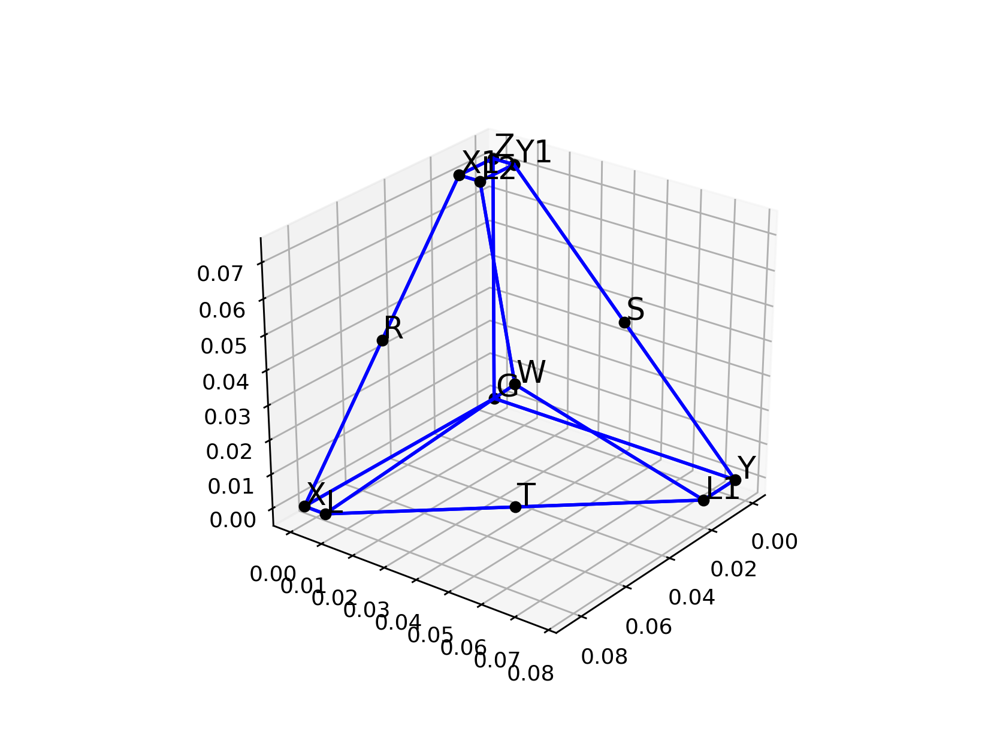

In [226]:
lat_type = "body-centered orthorhombic"
lat_vecs = make_lattice_vectors(lat_type, [10, 12, 14],
                                [np.pi/2]*3)
sympts = orci_sympts(10, 11, 12)
plot_bz_ibz(lat_type, lat_vecs, sympts)

## Base-centered orthorhombic (ORCC, oS)

BZ expected volume:  0.00444444444444
BZ volume:  0.004444444444444445
IBZ expected volume:  0.000555555555556
IBZ volume:  0.0005555555555555554


<IPython.core.display.Javascript object>


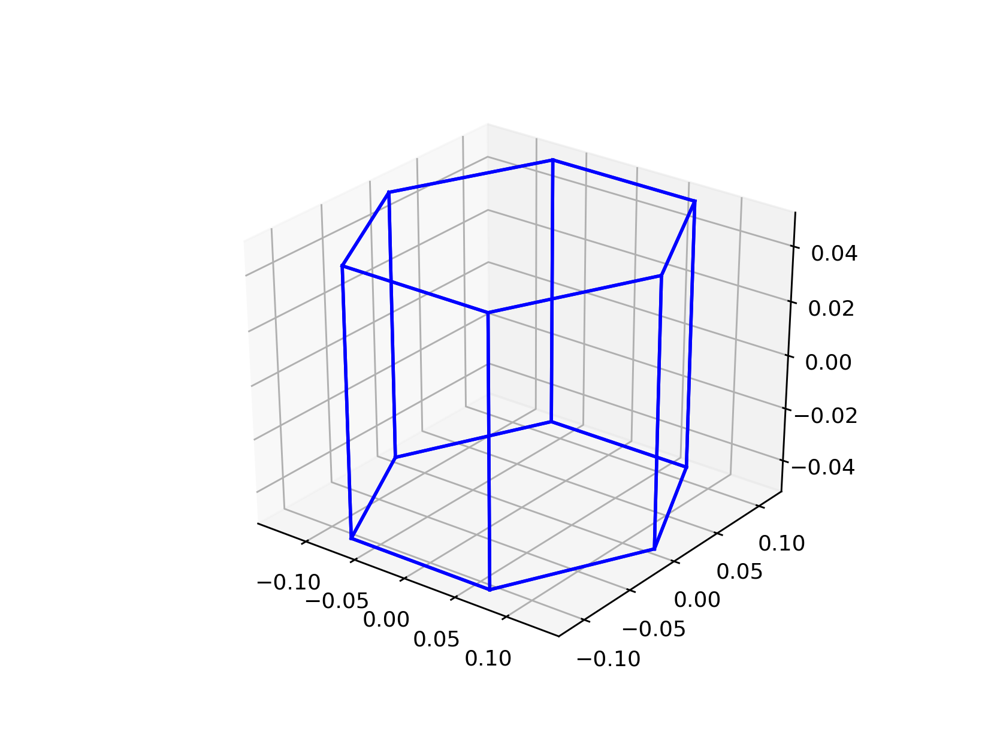

<IPython.core.display.Javascript object>


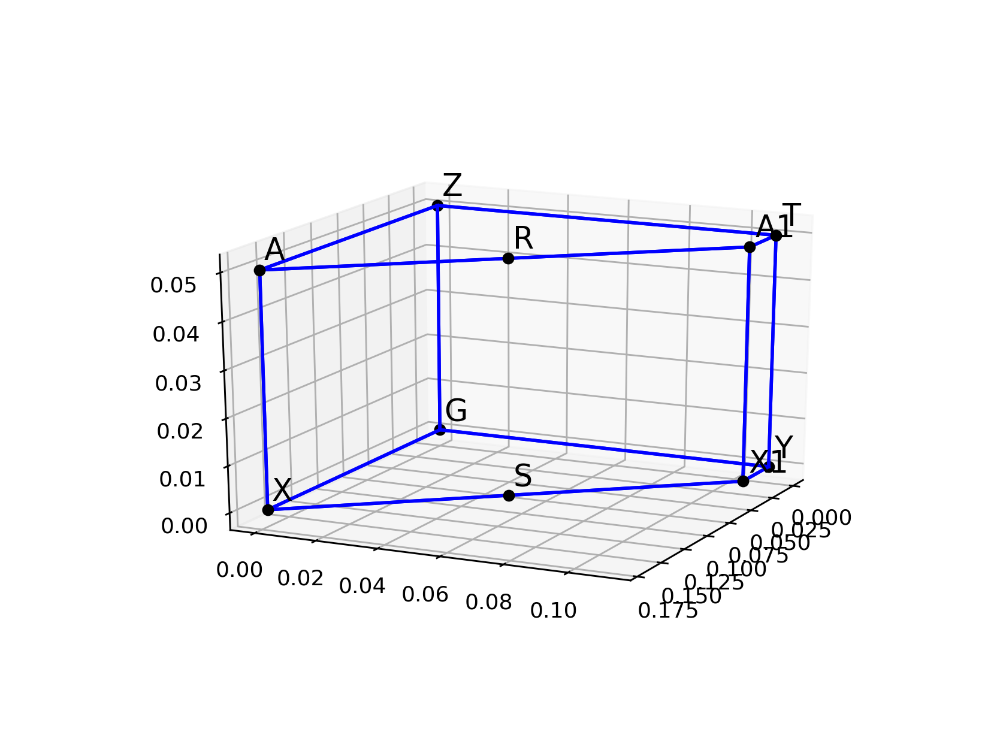

In [231]:
lat_type = "base-centered orthorhombic"
lat_vecs = make_lattice_vectors(lat_type, [5, 9, 10],
                                [np.pi/2]*3)
sympts = orcc_sympts(5, 6)
plot_bz_ibz(lat_type, lat_vecs, sympts)

# Hexagonal Brillouin zone

## Hexagonal (HEX, hP)

BZ expected volume:  0.0076980035892
BZ volume:  0.007698003589195012
IBZ expected volume:  0.00032075014955
IBZ volume:  0.0003207501495497921


<IPython.core.display.Javascript object>


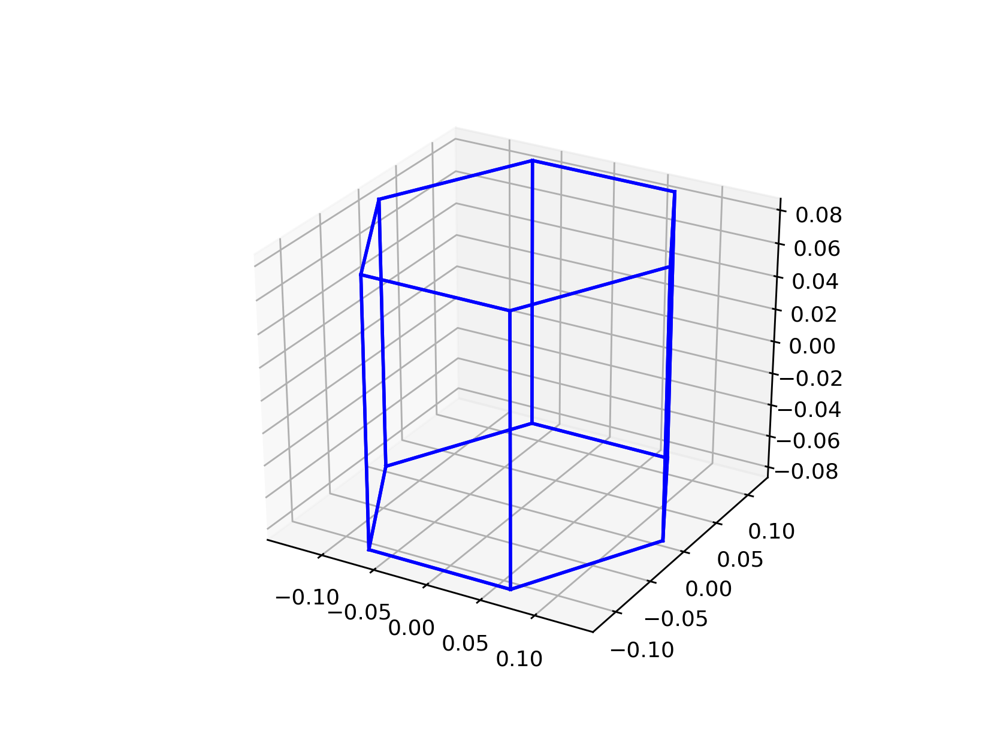

<IPython.core.display.Javascript object>


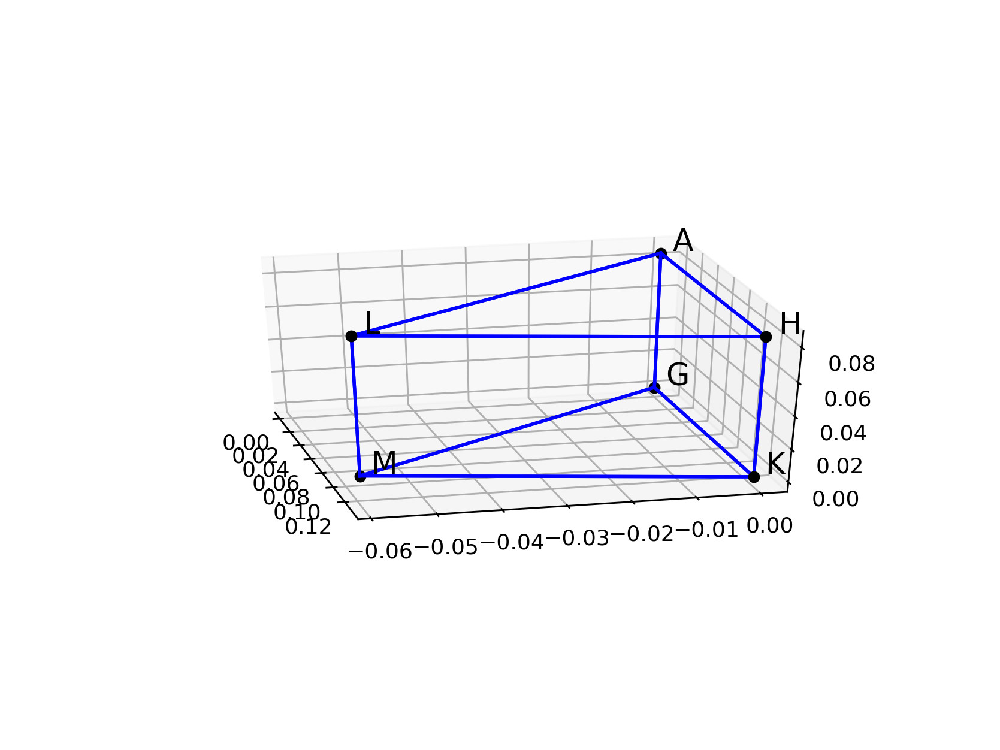

In [232]:
lat_type = "hexagonal"
lat_vecs = make_lattice_vectors(lat_type, [5, 5, 6],
                                [np.pi/2, np.pi/2, 2*np.pi/3])
plot_bz_ibz(lat_type, lat_vecs, hex_sympts)

# Rhombohedral Brillouin zones

## Rhombohedral (RHL, hR)

### $RHL_1$

BZ expected volume:  0.0131576969825
BZ volume:  0.013157696982525648
IBZ expected volume:  0.00109647474854
IBZ volume:  0.0010964747485438043


<IPython.core.display.Javascript object>


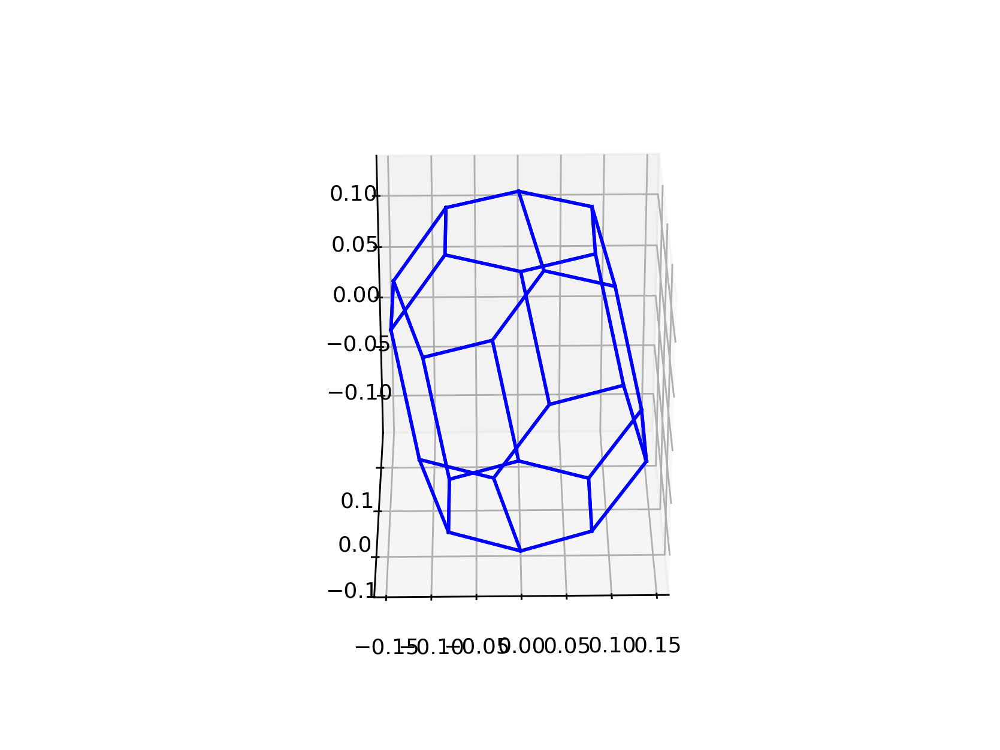

<IPython.core.display.Javascript object>


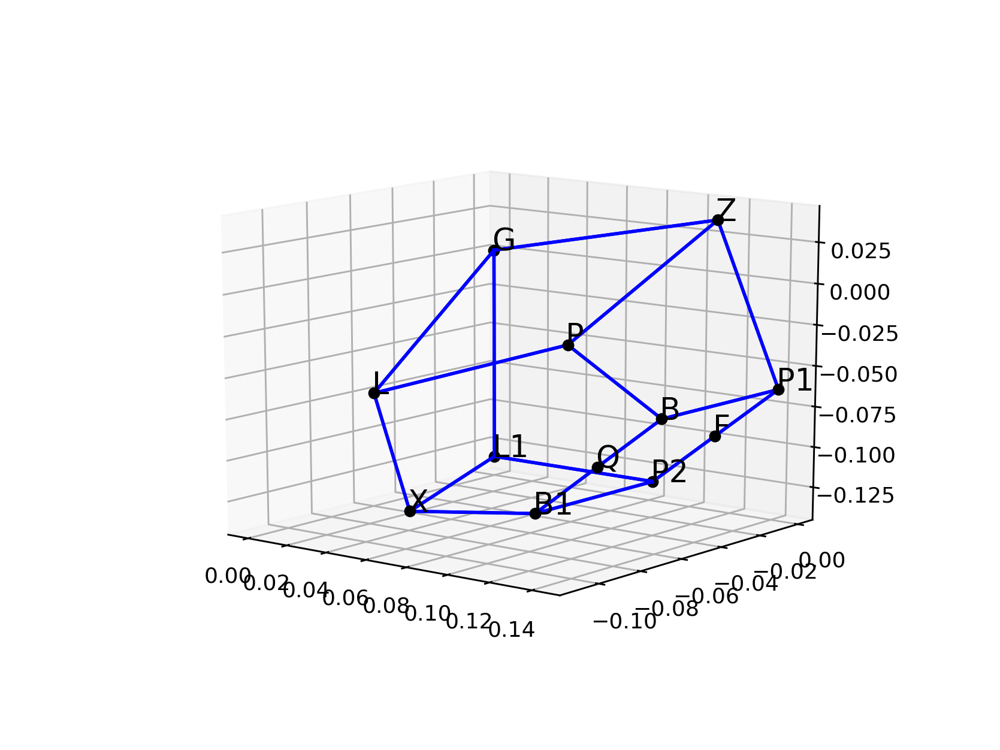

In [13]:
lat_type = "rhombohedral"
lat_vecs = make_lattice_vectors(lat_type, [5,5,5], [.3*np.pi]*3)
sympts = rhl1_sympts(.3*np.pi)
plot_bz_ibz(lat_type, lat_vecs, sympts)

### $RHL_2$

BZ expected volume:  0.00915040210531
BZ volume:  0.009150402105307513
IBZ expected volume:  0.000762533508776
IBZ volume:  0.0007625335087756261


<IPython.core.display.Javascript object>


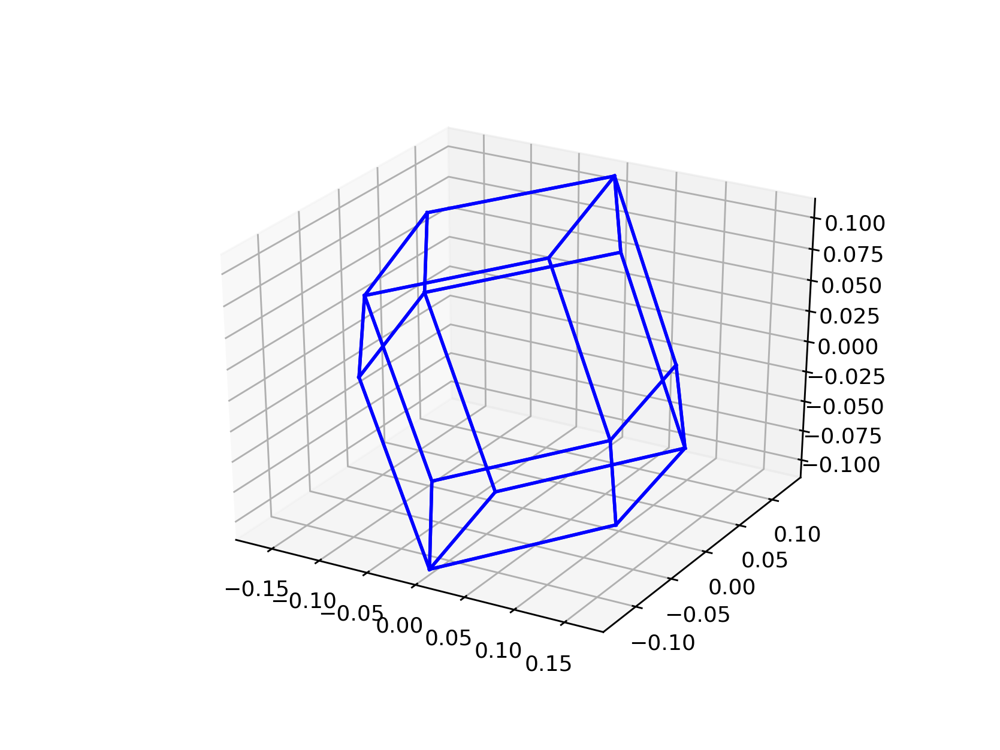

<IPython.core.display.Javascript object>


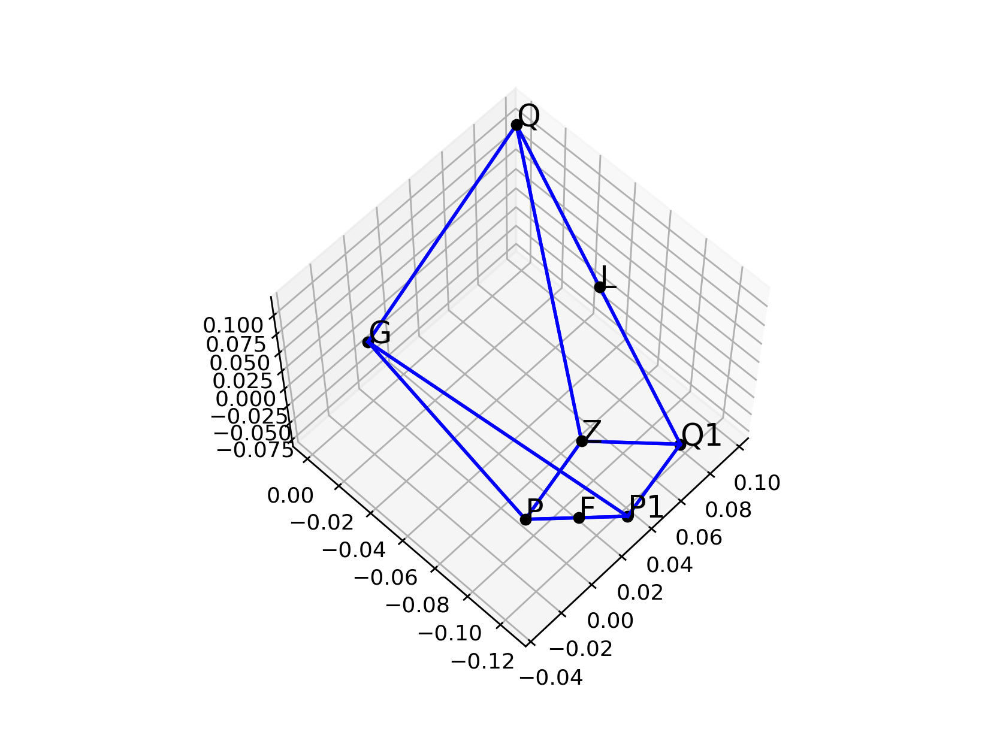

In [280]:
lat_type = "rhombohedral"
lat_vecs = make_lattice_vectors(lat_type, [5]*3, [7*np.pi/12]*3)
sympts = rhl2_sympts(7*np.pi/12)
plot_bz_ibz(lat_type, lat_vecs, sympts)

# Monoclinic Brillouin zones

## Monoclinic lattice (MCL, mP)

BZ expected volume:  0.000765366080711
BZ volume:  0.0007653660807106337
IBZ expected volume:  0.000191341520178
IBZ volume:  0.0001913415201776584


<IPython.core.display.Javascript object>


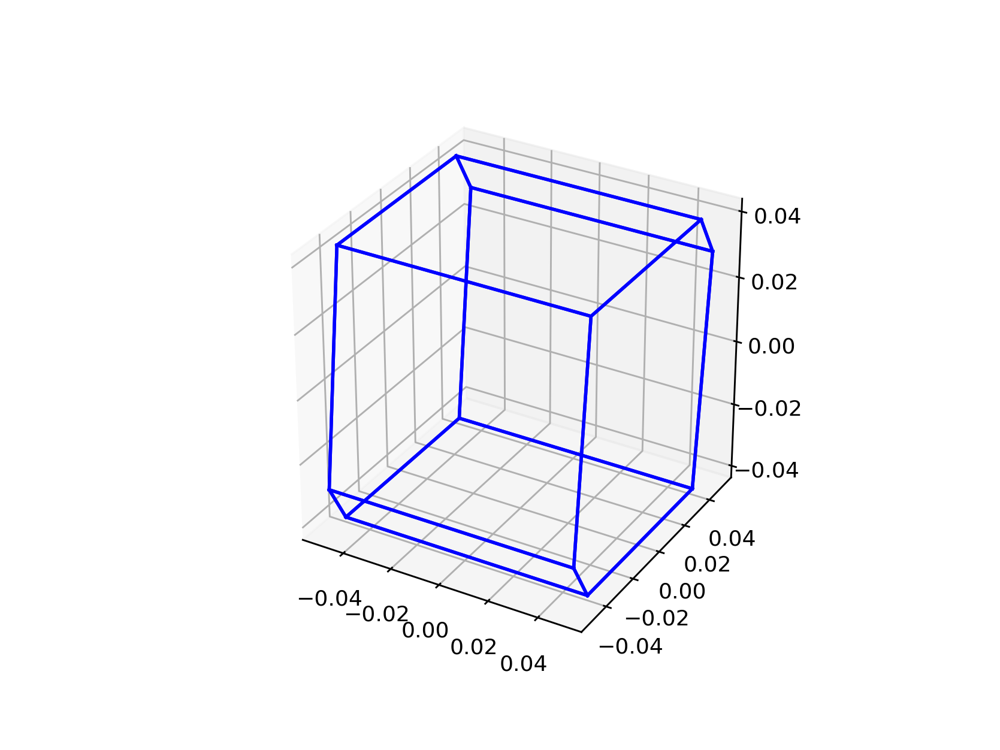

<IPython.core.display.Javascript object>


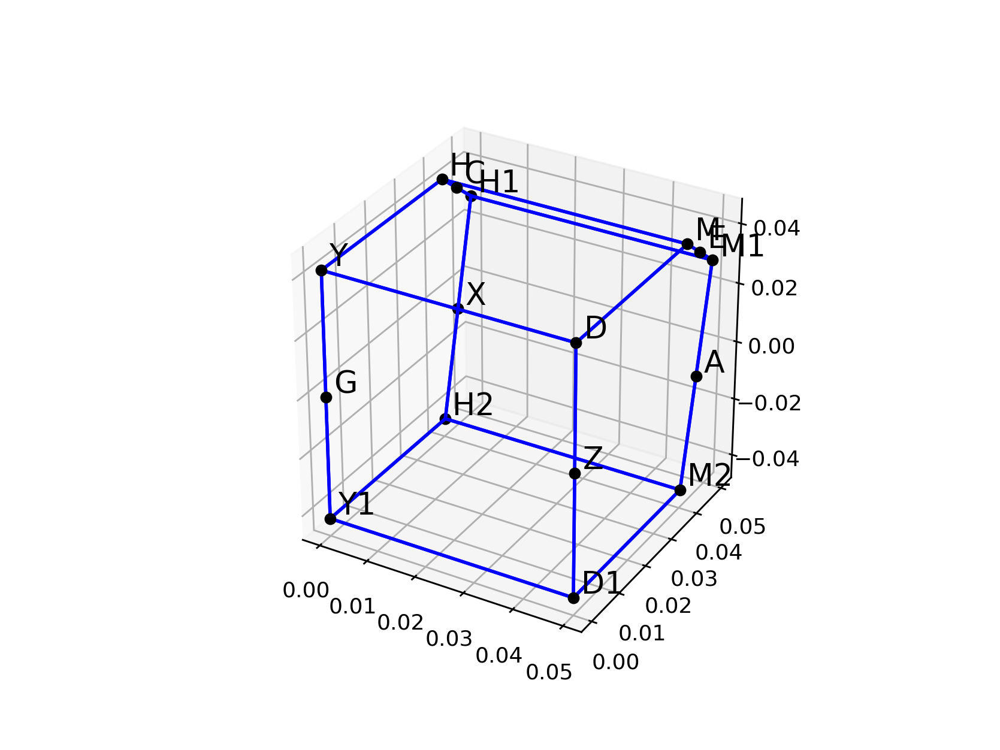

In [281]:
lat_type = "monoclinic"
lat_vecs = make_lattice_vectors(lat_type, [10, 11, 12],
                                [5*np.pi/11, np.pi/2, np.pi/2])
sympts = mcl_sympts(11, 12, 5*np.pi/11)
plot_bz_ibz(lat_type, lat_vecs, sympts)

## Base-centered monoclinic (MCLC, mS)

### $MCLC_1$

In [282]:
lat_type = "base-centered monoclinic"
lat_vecs = make_lattice_vectors(lat_type, [10, 11, 12],
                                [5*np.pi/11, np.pi/2, np.pi/2])
rlat_vecs = make_rptvecs(lat_vecs)

# Triclinic Brillouin zones

## Triclinic (TRI, aP)

### $TRI_{1a}$